# Single-Subject Model Evaluation

Subject-keyed views of the LORO cached predictions.

1. **Per-subject performance** — LORO fold mean per model, ranked by an anchor model.
2. **Subject specificity** — does the prediction match *its* subject's truth more than other subjects' truths at the same region?
3. **Spatial specificity** — does the prediction match its *region*'s truth more than the subject's other regions' truths?

## Table of Contents

- Notebook Configuration
- Shared Reconstruction
- Section 1 — Per-Subject Performance
- Section 2 — Subject Specificity
- Section 3 — Spatial Specificity


In [1]:
from pathlib import Path
import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

REPO_ROOT = Path.cwd().resolve()
if not (REPO_ROOT / "src").exists() and (REPO_ROOT.parent / "src").exists():
    REPO_ROOT = REPO_ROOT.parent
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

In [2]:
%matplotlib inline

import importlib
import src.eval_utils.eval_style as eval_style
import src.eval_utils.eda_core as eda_core
import src.eval_utils.eval_population as eval_population
import src.eval_utils.eval_single_subject as eval_single_subject
importlib.reload(eval_style)
importlib.reload(eda_core)
importlib.reload(eval_population)
importlib.reload(eval_single_subject)
from src.eval_utils.eval_style import *
from src.eval_utils.eval_population import *
from src.eval_utils.eval_single_subject import *


## Notebook Configuration

Global / cross-section knobs in the next cell. Per-section knobs (LORO coverage, anchor model, percentile shading, illustrative subjects, specificity) live in mini-config cells immediately above their use sites — edit those in place for fluid in-notebook iteration.


In [3]:
# === Global config ===
set_academic_style()

# Switch this one value when comparing cache families.
#   c        = centroid matching, covariate-aware ComBat
#   cv       = centroid+volume matching, covariate-aware ComBat
#   cv_nocov = centroid+volume matching, no ComBat covariates
CACHE_VARIANT = 'cv'  # 'c' | 'cv' | 'cv_nocov'
CACHE_VARIANTS = {
    'c': dict(
        cache_root='out/loro_subject_cache_c',
        combat_use_covariates=True,
        matching_policy='centroids',
        matching_policy_hemi_mode='force_left',
        collapse_cerebellum=False,
    ),
    'cv': dict(
        cache_root='out/loro_subject_cache_cv',
        combat_use_covariates=True,
        matching_policy='centroids_and_volumes',
        matching_policy_hemi_mode='force_left',
        collapse_cerebellum=False,
    ),
    'cv_nocov': dict(
        cache_root='out/loro_subject_cache_cv_nocov',
        combat_use_covariates=False,
        matching_policy='centroids_and_volumes',
        matching_policy_hemi_mode='force_left',
        collapse_cerebellum=False,
    ),
}
CACHE_CFG = CACHE_VARIANTS[CACHE_VARIANT]

CFG = EDAConfig(
    csv_path='data/raw/gxp_samples.csv',
    cache_root=CACHE_CFG['cache_root'],
    gene_scope='allgenes',
    combat_use_covariates=CACHE_CFG['combat_use_covariates'],
    matching_policy=CACHE_CFG['matching_policy'],
    matching_policy_hemi_mode=CACHE_CFG['matching_policy_hemi_mode'],
    collapse_cerebellum=CACHE_CFG['collapse_cerebellum'],
    gtex_rep_mode='centroid',
    gtex_hemi_mode='mirror_left',
)
print('cache variant:', CACHE_VARIANT)
print('cache root:', CFG.cache_root)
print('analysis scope:', CFG.gene_scope)
print('combat_use_covariates:', CFG.combat_use_covariates)
print('matching:', CFG.matching_policy, CFG.matching_policy_hemi_mode, 'collapse_cerebellum=', CFG.collapse_cerebellum)

MODELS                       = ['naive', 'dlam', 'plam']
N_JOBS                       = 16
CACHE_GLOBAL_TABLES          = True
FORCE_REBUILD_GLOBAL_TABLES  = False

VIEW_SUBSET = dict(
    genes=None, subjects=None, tissues=None,
    region_groups=None, sex=None, age=None,
)

DEFAULT_METRIC               = 'pearson_r'   # pearson_r | spearman_r | r2 | rmse

EVAL_GENE_LIST_PATH          = None  # path | None for all genes


cache variant: cv
cache root: out/loro_subject_cache_cv
analysis scope: allgenes
combat_use_covariates: True
matching: centroids_and_volumes force_left collapse_cerebellum= False


## Shared Reconstruction

`PREPOST` + canonical wide tables + filtered view used by Sections 2 & 3.


In [4]:
PREPOST = prepare_pre_post_harmonization_cached(CFG)
print('subjects:', len(PREPOST['subjects']))
print('genes:', len(PREPOST['genes']))
print('parcels:', PREPOST['raw_cube'].shape[1])

[prepost_cache] hit  notebooks/cache/prepost/0f8616c23cf88e0f.pkl  (8961.2 MB)
subjects: 318
genes: 11704
parcels: 150


In [5]:
truth_df, pred_dfs, global_manifest = build_global_prediction_tables(
    cfg=CFG,
    prepost=PREPOST,
    models=MODELS,
    cache=CACHE_GLOBAL_TABLES,
    force_rebuild=FORCE_REBUILD_GLOBAL_TABLES,
    n_jobs=N_JOBS,
)
print({model: df.shape for model, df in pred_dfs.items()})

{'naive': (2869, 11722), 'dlam': (2869, 11722), 'plam': (2869, 11722)}


In [6]:
subject_view = make_prediction_eval_view(
    truth_df=truth_df,
    pred_dfs=pred_dfs,
    eval_gene_list_path=EVAL_GENE_LIST_PATH,
    models=MODELS,
    **VIEW_SUBSET,
)

## Section 1 — Per-Subject Performance

Per-subject LORO mean per model. Subjects are sorted by the **anchor** model's mean; every other model is plotted on the same x positions for direct read-off.

Set `SPARSIFY=N` to keep one subject at every `100/N`-th percentile of the anchor model. The selected subjects come back as `band_subjects` for downstream illustrative-subject work.


In [7]:
# Section 1 config — per-subject performance & illustrative scatters
FOLD_COMBO_COVERAGE_MIN      = 5
FOLD_COMBO_COVERAGE_MAX      = 12
PERFORMANCE_FOLD_METRIC      = 'pearson_r'   # column in fold_perf_df

ANCHOR_MODEL                 = 'dlam'        # ranked / shaded / illustrated against this model
SPARSIFY                     = 100           # one subject per (100/SPARSIFY)% of anchor distribution; None = all
BOTTOM_QUANTILE              = 0.20          # static fallback red-shade leftmost % (None = off)
DYNAMIC_BOTTOM_QUANTILE      = True          # override BOTTOM_QUANTILE with anchor>naive crossover
TOP_QUANTILE                 = None          # green-shade rightmost % (None = off)


In [8]:
fold_perf_df, combo_df = compute_fold_combo_metrics_from_cache(
    CFG,
    PREPOST,
    coverage_min=FOLD_COMBO_COVERAGE_MIN,
    coverage_max=FOLD_COMBO_COVERAGE_MAX,
    models=MODELS,
    eval_gene_path=EVAL_GENE_LIST_PATH,
    n_jobs=N_JOBS,
)
print('fold_perf_df:', fold_perf_df.shape)
print('combo_df:', combo_df.shape)

fold_perf_df: (8607, 16)
combo_df: (4509, 17)


In [9]:
subject_perf = compute_subject_performance(
    fold_perf_df,
    metric=PERFORMANCE_FOLD_METRIC,
    models=MODELS,
)
print('subject_perf:', subject_perf.shape)
display(
    subject_perf.groupby('model', as_index=False)
    .agg(n_subjects=('subject', 'nunique'),
         mean=('mean', 'mean'),
         median=('mean', 'median'),
         worst=('mean', 'min'),
         best=('mean', 'max'))
)

subject_perf: (954, 6)


,model,n_subjects,mean,median,worst,best
0,dlam,318,0.951013,0.959735,0.808970,0.982744
1,naive,318,0.947939,0.952087,0.871075,0.965044
2,plam,318,0.948537,0.955415,0.826146,0.974785


In [10]:
# Percentile-band subject selection anchored on the chosen model.
band_subjects = select_subjects_by_percentile(
    subject_perf,
    metric=PERFORMANCE_FOLD_METRIC,
    model=ANCHOR_MODEL,
    n_bands=int(SPARSIFY) if SPARSIFY else 100,
)
display(band_subjects)

,selection_index,percentile_anchor,subject,model,mean,std,n_folds,percentile_rank,target_value
0,0,0.5,GTEX-15ER7,dlam,0.818408,0.042384,11,0.943396,0.816511
1,1,1.5,GTEX-WHSE,dlam,0.821828,0.046295,12,1.886792,0.821572
2,2,2.5,GTEX-1JMPZ,dlam,0.871073,0.023047,10,2.830189,0.868663
3,3,3.5,GTEX-1HT8W,dlam,0.879021,0.034135,8,3.773585,0.879196
4,4,4.5,GTEX-1PIIG,dlam,0.886262,0.035970,11,4.716981,0.886932
...,...,...,...,...,...,...,...,...,...
95,95,95.5,GTEX-13FLV,dlam,0.975123,0.007432,10,95.597484,0.975092
96,96,96.5,GTEX-13SLX,dlam,0.975734,0.011581,10,96.540881,0.975698
97,97,97.5,GTEX-1C64N,dlam,0.977445,0.012890,7,97.484277,0.977484
98,98,98.5,GTEX-13OVJ,dlam,0.979531,0.010955,11,98.427673,0.979646


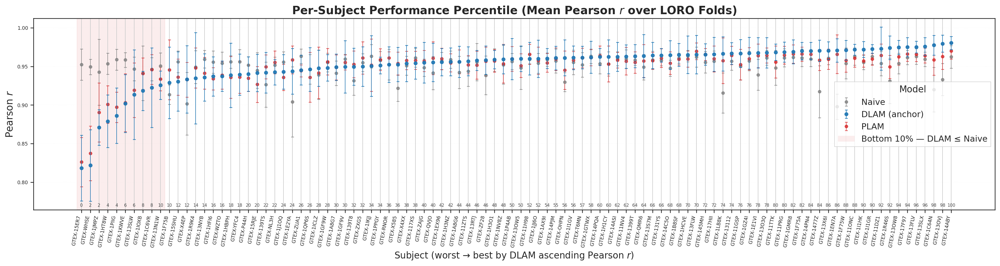

In [11]:
fig, ax, ranked_summary = plot_subject_performance_ranked(
    subject_perf,
    metric=PERFORMANCE_FOLD_METRIC,
    models=MODELS,
    sparsify=SPARSIFY,
    anchor_model=ANCHOR_MODEL,
    bottom_quantile=BOTTOM_QUANTILE,
    dynamic_bottom_quantile=DYNAMIC_BOTTOM_QUANTILE,
    top_quantile=TOP_QUANTILE,
)

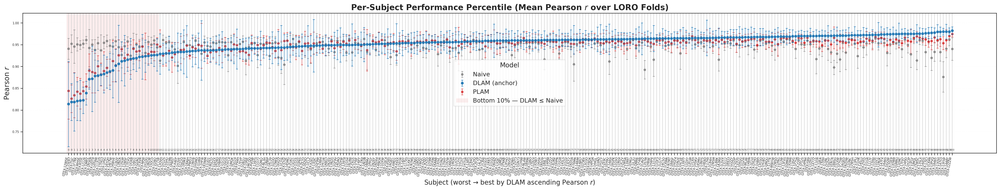

In [12]:
fig, ax, ranked_summary = plot_subject_performance_ranked(
    subject_perf,
    metric=PERFORMANCE_FOLD_METRIC,
    models=MODELS,
    sparsify=300,
    anchor_model=ANCHOR_MODEL,
)

### Percentile distribution histogram

Histogram view of the same subject-level performance distribution used by the ranked percentile curves. Vertical lines mark the illustrative percentile picks for the anchor model.


In [13]:
# Percentile histogram toggles -- edit these before running this section.
PERCENTILE_HIST_BINS = 20
PERCENTILE_HIST_FIGSIZE = (10.5, 6.2)
PERCENTILE_HIST_ALPHA = 0.46
PERCENTILE_HIST_SHOW_PICK_LINES = True


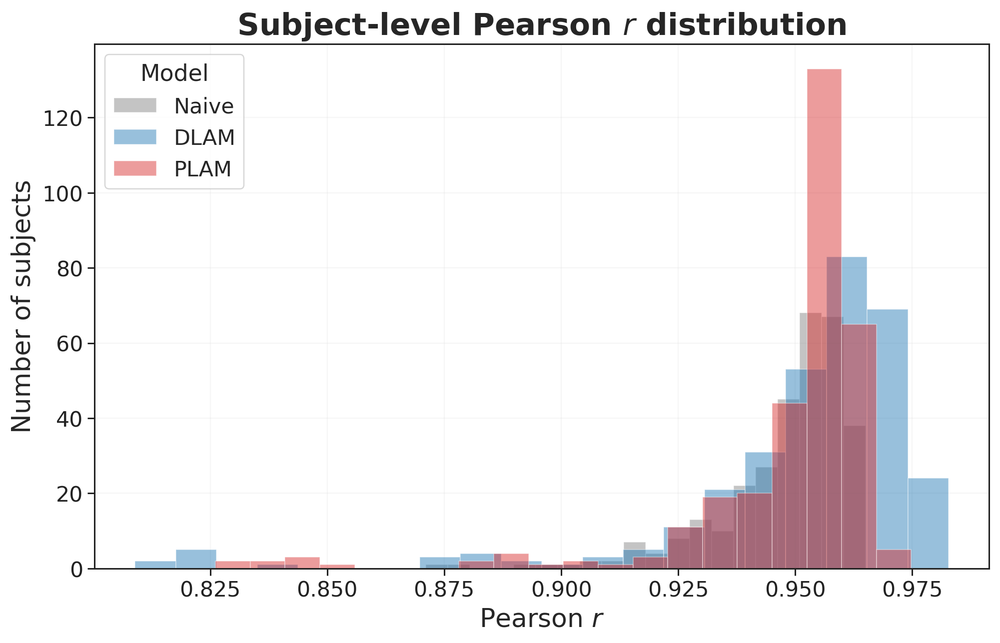

In [14]:
fig, ax = plt.subplots(figsize=PERCENTILE_HIST_FIGSIZE, dpi=220)
for model in ordered_models(MODELS):
    d = subject_perf[subject_perf['model'].astype(str) == str(model)]
    ax.hist(
        d['mean'].astype(float),
        bins=PERCENTILE_HIST_BINS,
        alpha=PERCENTILE_HIST_ALPHA,
        color=MODEL_COLORS.get(model),
        label=model_label(model),
        edgecolor='white',
        linewidth=0.5,
    )
if PERCENTILE_HIST_SHOW_PICK_LINES:
    if 'pct_picks' in globals():
        _hist_pct_picks = pct_picks
    elif 'band_subjects' in globals() and not band_subjects.empty:
        pct = band_subjects['percentile_anchor'].astype(float).round().astype(int)
        _hist_pct_picks = band_subjects.iloc[[(pct - p).abs().idxmin() for p in ILLUSTRATIVE_PERCENTILES]] if 'ILLUSTRATIVE_PERCENTILES' in globals() else band_subjects.iloc[[]]
    else:
        _hist_percentiles = ILLUSTRATIVE_PERCENTILES if 'ILLUSTRATIVE_PERCENTILES' in globals() else [5, 50, 95]
        _hist_pct_picks = select_subjects_by_percentile(
            subject_perf, metric=PERFORMANCE_FOLD_METRIC, model=ANCHOR_MODEL,
            percentiles=[p / 100.0 for p in _hist_percentiles],
        )
    anchor = subject_perf[subject_perf['model'].astype(str) == str(ANCHOR_MODEL)]
    for _, row in _hist_pct_picks.iterrows():
        x = float(anchor.loc[anchor['subject'].astype(str) == str(row['subject']), 'mean'].iloc[0])
        ax.axvline(x, color=MODEL_COLORS.get(ANCHOR_MODEL, '#333333'), linestyle='--', linewidth=1.4, alpha=0.75)
        ax.text(x, ax.get_ylim()[1] * 0.96, f"p{float(row['percentile_anchor']):.0f}",
                rotation=90, ha='right', va='top', fontsize=12)
ax.set_title(f'Subject-level {format_legend_label(PERFORMANCE_FOLD_METRIC)} distribution', fontsize=20)
ax.set_xlabel(format_legend_label(PERFORMANCE_FOLD_METRIC), fontsize=17)
ax.set_ylabel('Number of subjects', fontsize=17)
ax.tick_params(axis='both', labelsize=14)
ax.legend(frameon=True, fontsize=14, title='Model', title_fontsize=15)
ax.grid(True, alpha=0.16)
plt.show()


### Illustrative subjects (10 / 50 / 90 percentile)

Truth-vs-prediction scatter for one subject at each performance percentile of the anchor model. Color = GTEx tissue.


In [15]:
# Illustrative-subject scatter config
ILLUSTRATIVE_PERCENTILES     = [5, 50, 95]
ILLUSTRATIVE_FIGSIZE         = (10.5, 9.0)
ILLUSTRATIVE_ANNOTATE_METRIC = 'pearson_r'   # per-category metric in legend; None = off

ILLUSTRATIVE_POINT_SIZE_REGION = 52.0
ILLUSTRATIVE_ALPHA_REGION     = 0.94
ILLUSTRATIVE_FONT_SIZES       = dict(suptitle=26, title=22, xlabel=19, ylabel=19, tick=16, legend=16, legend_title=17, annotation=16)


In [16]:
# Pick subjects nearest to ILLUSTRATIVE_PERCENTILES from band_subjects (or compute on-the-fly).
if 'band_subjects' in globals() and not band_subjects.empty:
    pct = band_subjects['percentile_anchor'].astype(float).round().astype(int)
    pct_picks = band_subjects.iloc[[(pct - p).abs().idxmin() for p in ILLUSTRATIVE_PERCENTILES]]
else:
    pct_picks = select_subjects_by_percentile(
        subject_perf, metric=PERFORMANCE_FOLD_METRIC, model=ANCHOR_MODEL,
        percentiles=[p / 100.0 for p in ILLUSTRATIVE_PERCENTILES],
    )

def _suptitle(fig, row, suffix=''):
    fig.suptitle(
        f"{model_label(ANCHOR_MODEL)} vs Truth — Subject {row['subject']} — "
        f"p{float(row['percentile_anchor']):.0f} "
        f"({format_legend_label(PERFORMANCE_FOLD_METRIC)} mean={float(row['mean']):.3f})"
        + (f" — {suffix}" if suffix else ''),
        fontsize=font_size('xxl'), y=0.97,
    )

def _make_subview(row, gene_list_path):
    return make_prediction_eval_view(
        truth_df=truth_df, pred_dfs=pred_dfs,
        eval_gene_list_path=gene_list_path,
        models=[ANCHOR_MODEL], subjects=[row['subject']],
        **{k: v for k, v in VIEW_SUBSET.items() if k != 'subjects'},
    )


##### View A — colored by region

Full gene scope. One figure per illustrative-percentile subject.


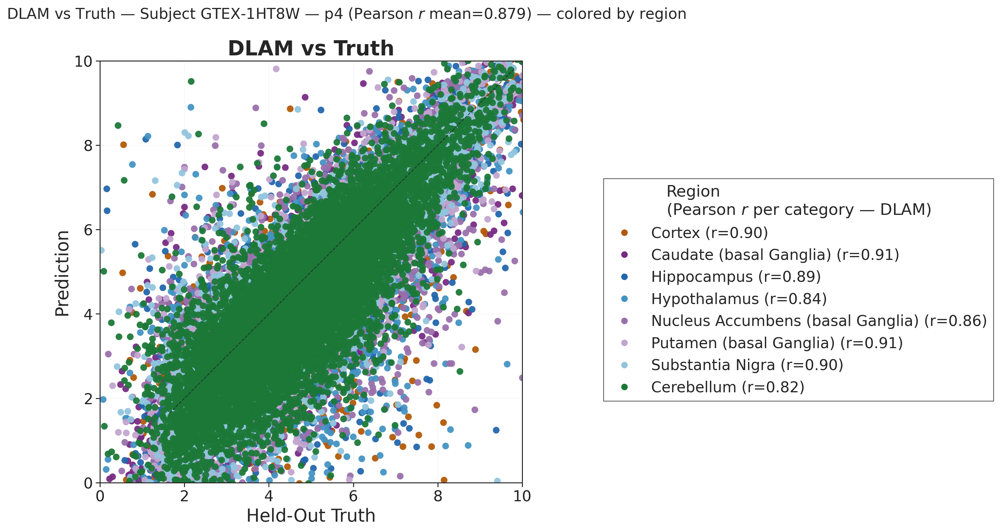

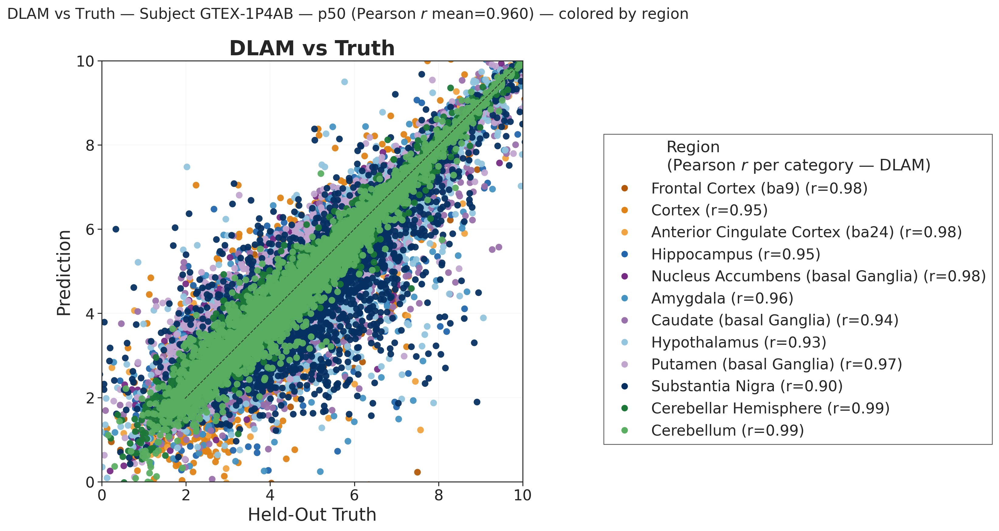

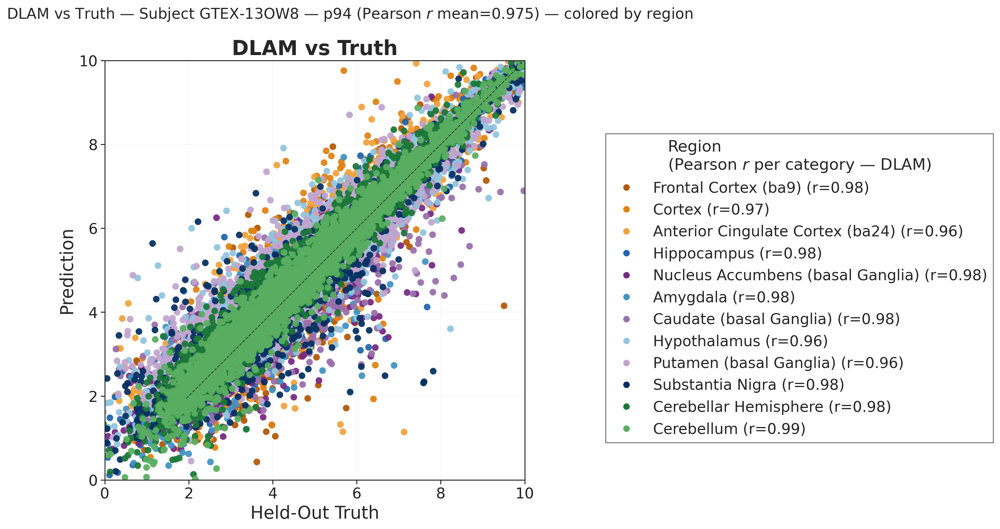

In [17]:
for _, row in pct_picks.iterrows():
    sub_view = _make_subview(row, EVAL_GENE_LIST_PATH)
    fig, axes = plot_global_prediction_scatter(
        sub_view,
        color_by='region',
        figsize=ILLUSTRATIVE_FIGSIZE,
        point_size=ILLUSTRATIVE_POINT_SIZE_REGION,
        alpha=ILLUSTRATIVE_ALPHA_REGION,
        font_sizes=ILLUSTRATIVE_FONT_SIZES,
        annotate_metric_in_legend=ILLUSTRATIVE_ANNOTATE_METRIC is not None,
        annotation_metric=ILLUSTRATIVE_ANNOTATE_METRIC or 'pearson_r',
    )
    _suptitle(fig, row, 'colored by region')


##### View B — colored by gene (HVG subset)

Same 3 subjects, restricted to `ILLUSTRATIVE_GENE_LIST_HVG`. Top-N genes get the categorical palette; the rest render as 'Other'.


In [18]:
# View B (gene-stratified) restricts the scatter to a gene list path/basename.
ILLUSTRATIVE_GENE_LIST_HVG   = 'richiardi2015'
ILLUSTRATIVE_GENE_TOP_N      = 10            # top-N genes shown in the legend

# View C (focus gene) isolates a single gene's panel from view B.
ILLUSTRATIVE_FOCUS_GENE      = 'CRYBA2'

# Views B/C/D share a larger canvas than View A's ILLUSTRATIVE_FIGSIZE.
ILLUSTRATIVE_FIGSIZE_BC      = (14.5, 11.5)
# Marker size for the gene-sublist views (B/C/D); default scatter point_size is 1.4,
# tuned for 100k-point population plots — far too small for these subsetted panels.
ILLUSTRATIVE_POINT_SIZE_BC   = 82.0
ILLUSTRATIVE_ALPHA_BC        = 0.92
ILLUSTRATIVE_FONT_SIZES_BC   = dict(suptitle=28, title=23, xlabel=20, ylabel=20, tick=17, legend=17, legend_title=18, annotation=17)


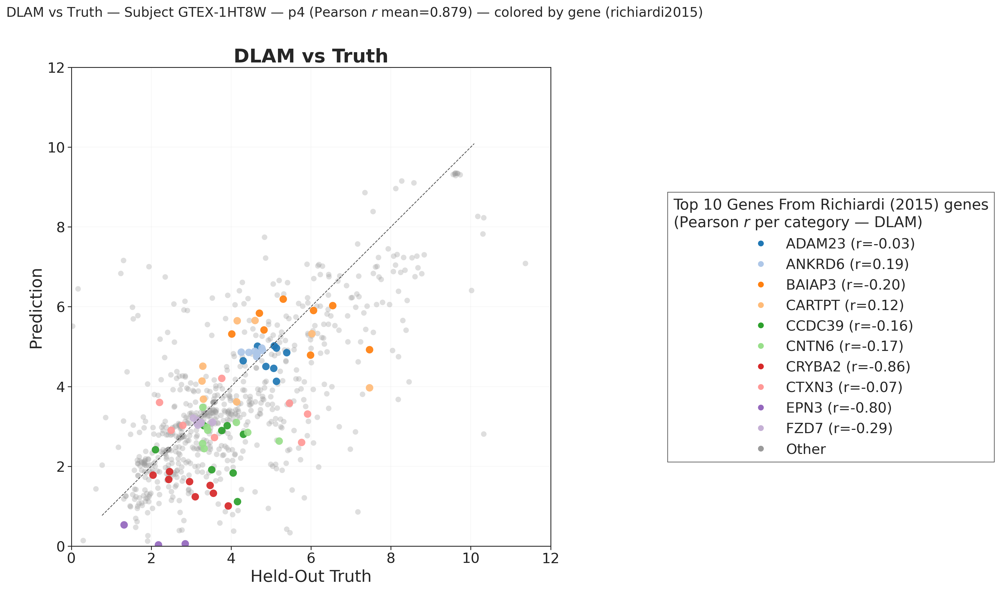

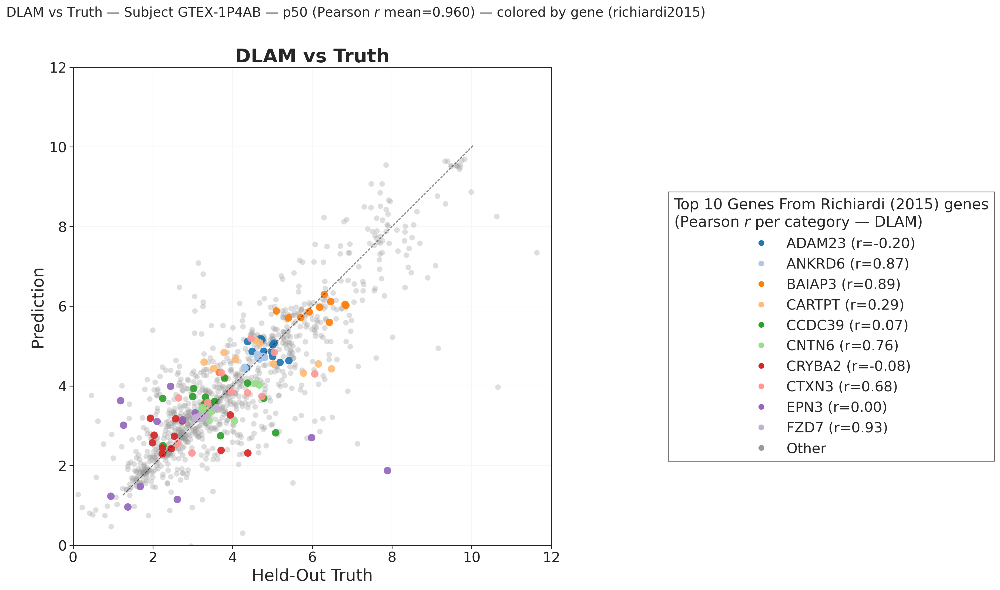

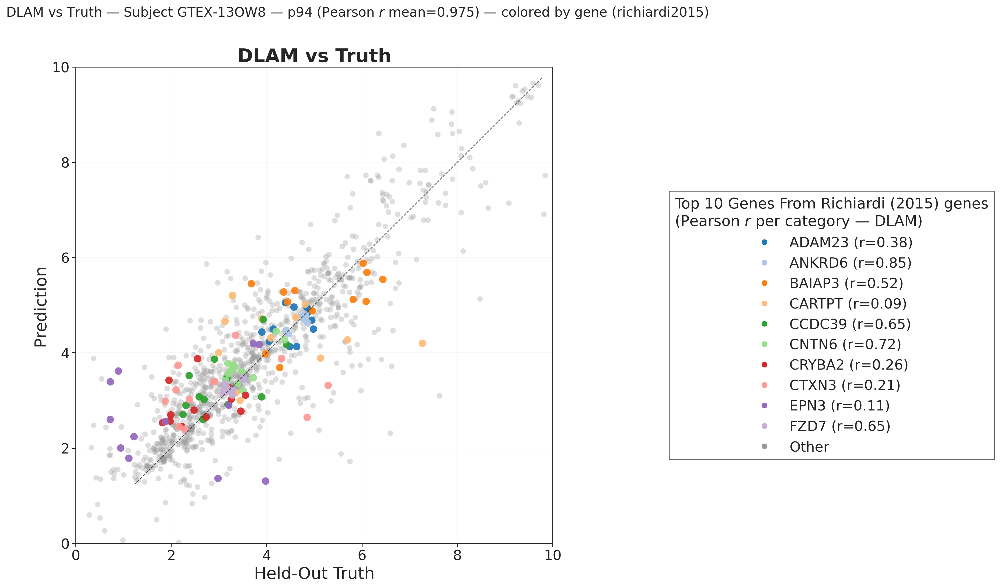

In [19]:
for _, row in pct_picks.iterrows():
    sub_view = _make_subview(row, ILLUSTRATIVE_GENE_LIST_HVG)
    fig, axes = plot_global_prediction_scatter(
        sub_view,
        color_by='gene',
        top_n=ILLUSTRATIVE_GENE_TOP_N,
        figsize=ILLUSTRATIVE_FIGSIZE_BC,
        point_size=ILLUSTRATIVE_POINT_SIZE_BC,
        alpha=ILLUSTRATIVE_ALPHA_BC,
        font_sizes=ILLUSTRATIVE_FONT_SIZES_BC,
        annotate_metric_in_legend=ILLUSTRATIVE_ANNOTATE_METRIC is not None,
        annotation_metric=ILLUSTRATIVE_ANNOTATE_METRIC or 'pearson_r',
    )
    _suptitle(fig, row, f"colored by gene ({ILLUSTRATIVE_GENE_LIST_HVG})")


##### View C — focus gene isolated

Same 3 subjects + HVG subset, with `ILLUSTRATIVE_FOCUS_GENE` appended as a side panel: only that gene's points across regions, plus a goodness-of-fit line.


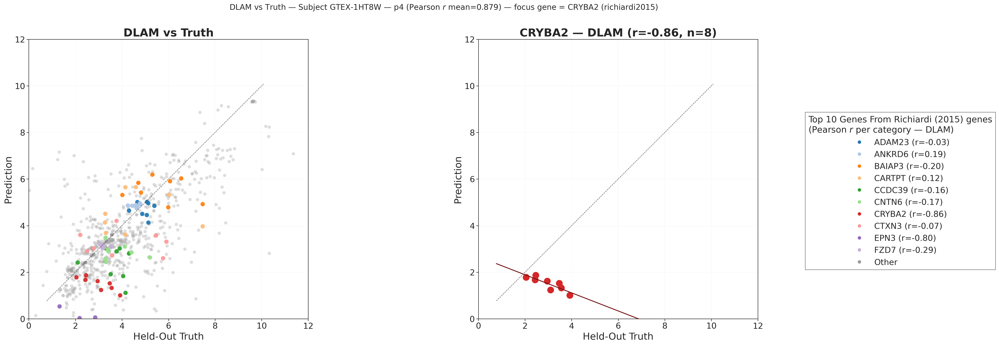

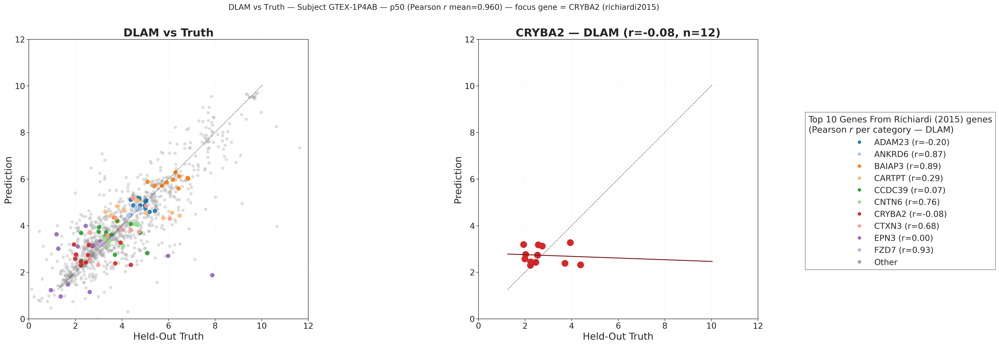

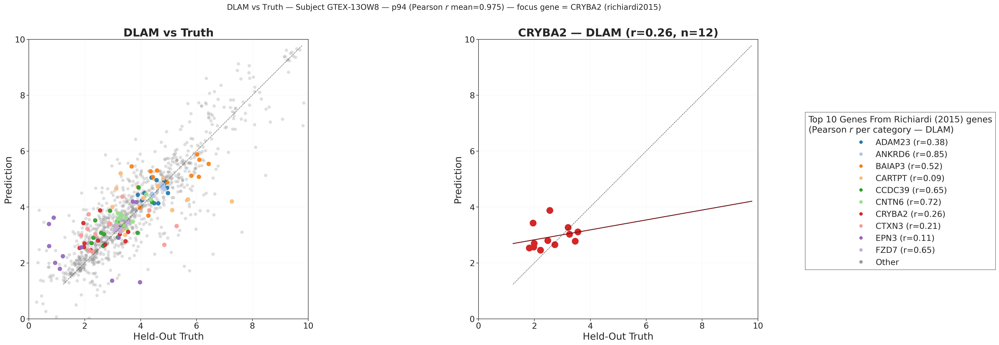

In [20]:
for _, row in pct_picks.iterrows():
    sub_view = _make_subview(row, ILLUSTRATIVE_GENE_LIST_HVG)
    fig, axes = plot_global_prediction_scatter(
        sub_view,
        color_by='gene',
        top_n=ILLUSTRATIVE_GENE_TOP_N,
        figsize=ILLUSTRATIVE_FIGSIZE_BC,
        point_size=ILLUSTRATIVE_POINT_SIZE_BC,
        alpha=ILLUSTRATIVE_ALPHA_BC,
        font_sizes=ILLUSTRATIVE_FONT_SIZES_BC,
        annotate_metric_in_legend=ILLUSTRATIVE_ANNOTATE_METRIC is not None,
        annotation_metric=ILLUSTRATIVE_ANNOTATE_METRIC or 'pearson_r',
        isolate_stratum=ILLUSTRATIVE_FOCUS_GENE,
    )
    _suptitle(fig, row, f"focus gene = {ILLUSTRATIVE_FOCUS_GENE} ({ILLUSTRATIVE_GENE_LIST_HVG})")


##### View D — focus gene, colored by region

Same 3 subjects, isolated to `ILLUSTRATIVE_FOCUS_GENE`. The subview is built at full
gene scope and then subset to that one gene, so View D does not depend on the focus
gene being in `ILLUSTRATIVE_GENE_LIST_HVG`. Each point is one of the subject's covered
regions, colored by region — this shows how that single gene's prediction tracks truth
*across the subject's brain*. With only ~5-13 points per panel, the legend metric is
descriptive, not a headline number.


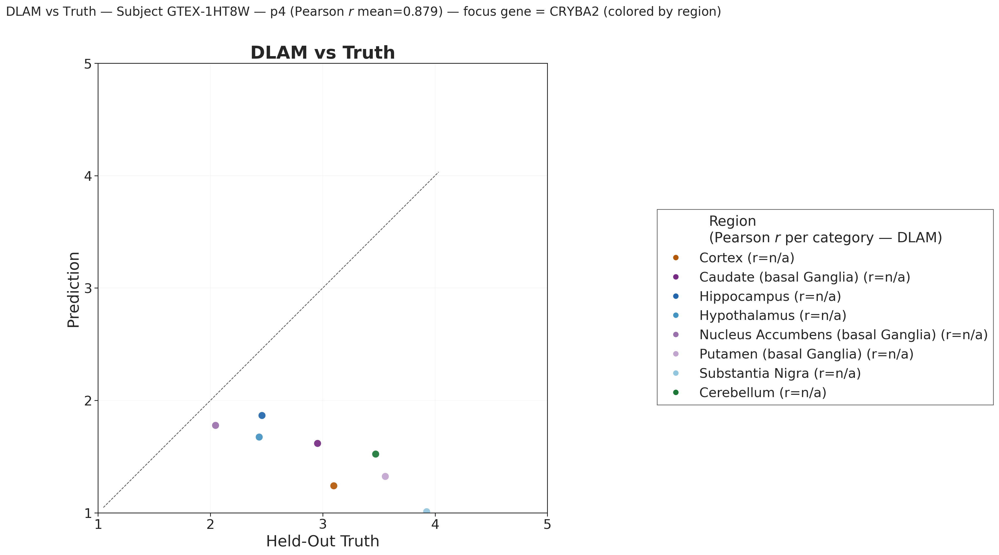

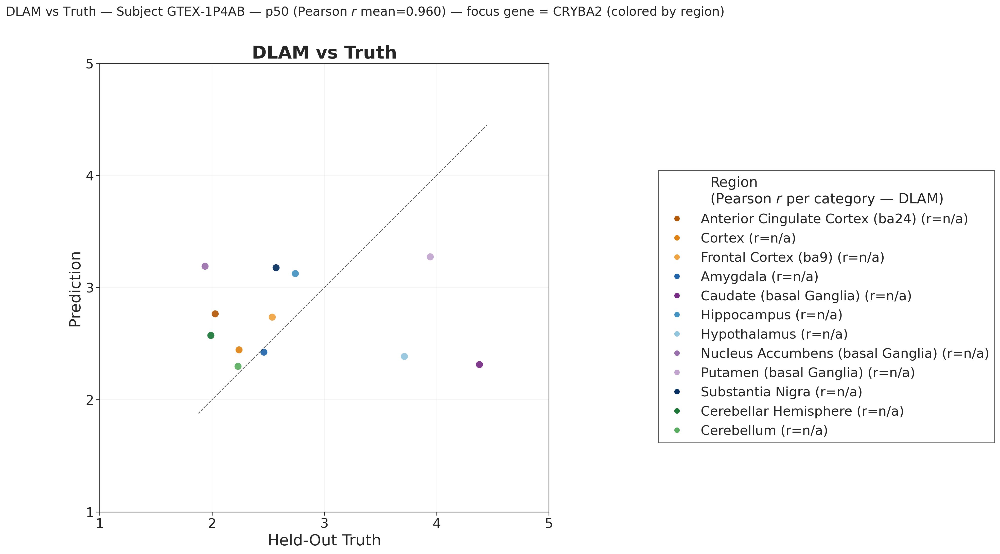

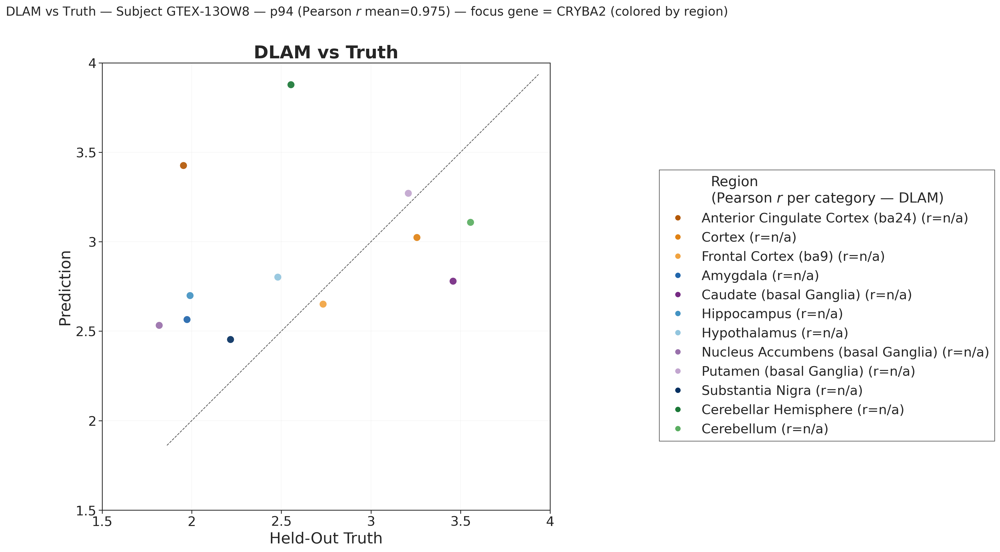

In [21]:
# View D isolates one gene (genes=[...]) instead of isolate_stratum, leaving
# color_by free to use 'region'. Subject is already isolated by _make_subview.
for _, row in pct_picks.iterrows():
    sub_view = _make_subview(row, None)              # full gene scope...
    fig, axes = plot_global_prediction_scatter(
        sub_view,
        genes=[ILLUSTRATIVE_FOCUS_GENE],             # ...isolate to one gene
        color_by='region',                          # ...colored by all regions
        figsize=ILLUSTRATIVE_FIGSIZE_BC,
        point_size=ILLUSTRATIVE_POINT_SIZE_BC,
        alpha=ILLUSTRATIVE_ALPHA_BC,
        font_sizes=ILLUSTRATIVE_FONT_SIZES_BC,
        annotate_metric_in_legend=ILLUSTRATIVE_ANNOTATE_METRIC is not None,
        annotation_metric=ILLUSTRATIVE_ANNOTATE_METRIC or 'pearson_r',
    )
    _suptitle(fig, row, f"focus gene = {ILLUSTRATIVE_FOCUS_GENE} (colored by region)")


## Section 2 — Subject Specificity

Per LORO sample, two comparisons of the same prediction:

- **Self** — the subject's own truth at that region.
- **Other Subjects (mean)** — the mean of every other subject's truth at that same region.

Self ≫ Other ⇒ predictions are subject-specific. Self ≈ Other ⇒ predictions are converging on a regional template.


In [22]:
# Sections 2 & 3 — specificity config
SPECIFICITY_REGION_COL       = 'parcel_idx'
SHOW_SPATIAL_SPECIFICITY     = True


# Section 2/3 visual toggles.
SPECIFICITY_FIGSIZE          = (12.5, 7.2)
SPECIFICITY_DPI              = 220
SPECIFICITY_ANNOTATE_TEST    = True
SPECIFICITY_FONT_SIZES       = dict(title=22, xlabel=19, ylabel=19, tick=16, legend=15, legend_title=16)


,model,n,median_self,median_other,median_delta
0,dlam,2869,0.961319,0.937874,0.020402
1,naive,2869,0.954925,0.952299,0.005224
2,plam,2869,0.955720,0.938515,0.017625


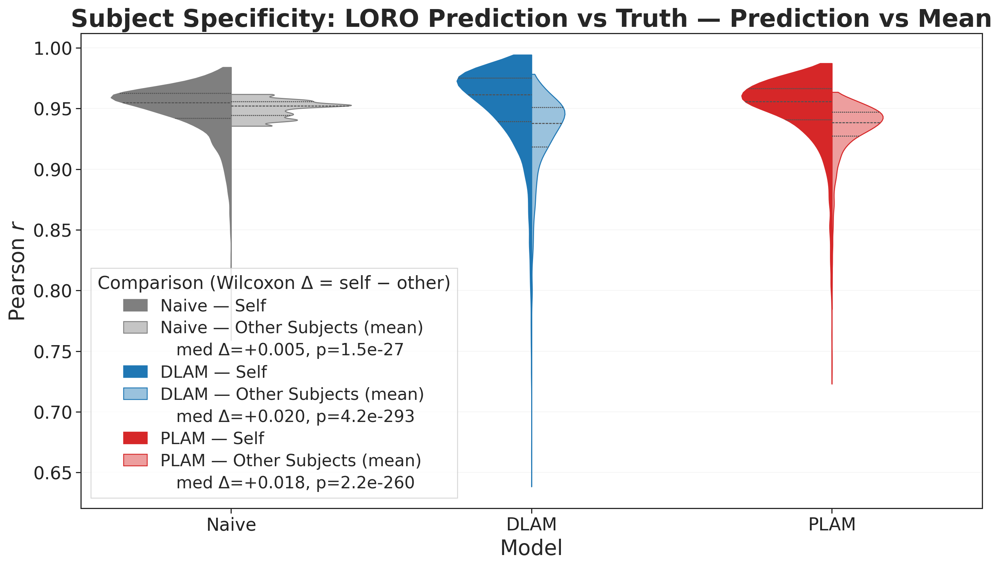

In [23]:
subject_specificity = compute_subject_specificity(
    subject_view,
    region_col=SPECIFICITY_REGION_COL,
    metric=DEFAULT_METRIC,
)

display(
    subject_specificity
    .groupby('model', as_index=False)
    .agg(
        n=('sim_self', 'size'),
        median_self=('sim_self', 'median'),
        median_other=('sim_other_mean', 'median'),
        median_delta=('delta', 'median'),
    )
)

fig, ax = plot_subject_specificity(
    subject_specificity,
    figsize=SPECIFICITY_FIGSIZE,
    dpi=SPECIFICITY_DPI,
    annotate_paired_test=SPECIFICITY_ANNOTATE_TEST,
    font_sizes=SPECIFICITY_FONT_SIZES,
)

## Section 3 — Spatial Specificity

Per LORO sample, two comparisons of the same prediction:

- **Self** — that *region*'s truth in the same subject.
- **Other Samples (within subject)** — mean of `k − 1` per-region metrics comparing the prediction to each *other* region's truth in the **same** subject.

Self ≫ Other ⇒ predictions are spatially differentiated within a brain. Self ≈ Other ⇒ a single subject-mean profile is being copied to every region (passes Section 2, fails here).


,model,n,median_self,median_other_region,median_delta
0,dlam,2869,0.961319,0.949499,0.009852
1,naive,2869,0.954925,0.918565,0.034284
2,plam,2869,0.955720,0.937970,0.016885


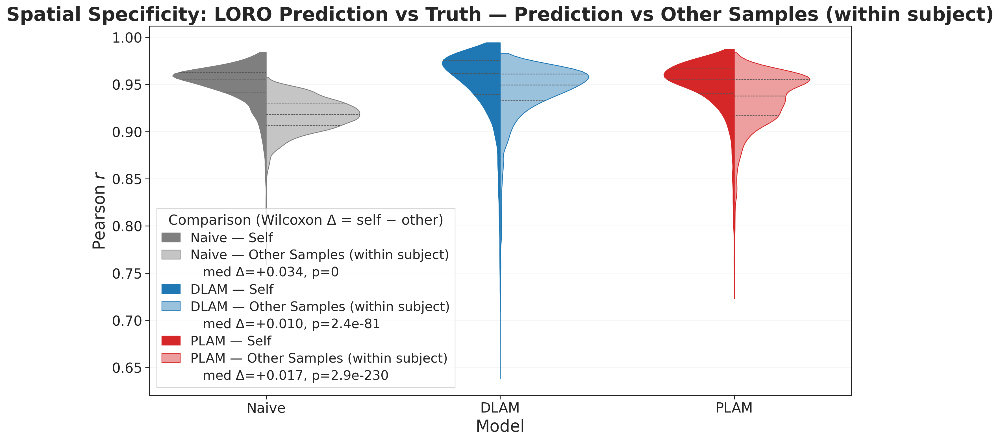

In [24]:
if SHOW_SPATIAL_SPECIFICITY:
    spatial_specificity = compute_spatial_specificity(
        subject_view,
        metric=DEFAULT_METRIC,
        region_col=SPECIFICITY_REGION_COL,
    )
    display(
        spatial_specificity
        .groupby('model', as_index=False)
        .agg(
            n=('sim_self', 'size'),
            median_self=('sim_self', 'median'),
            median_other_region=('sim_other_region_mean', 'median'),
            median_delta=('delta', 'median'),
        )
    )
    fig, ax = plot_spatial_specificity(
        spatial_specificity,
        figsize=SPECIFICITY_FIGSIZE,
        dpi=SPECIFICITY_DPI,
        annotate_paired_test=SPECIFICITY_ANNOTATE_TEST,
        font_sizes=SPECIFICITY_FONT_SIZES,
    )